# **Project "*Medical Insurance Cost Prediction*"**

In [76]:
# necessary library to visualize the former images of the AWS project 

from IPython.display import Image


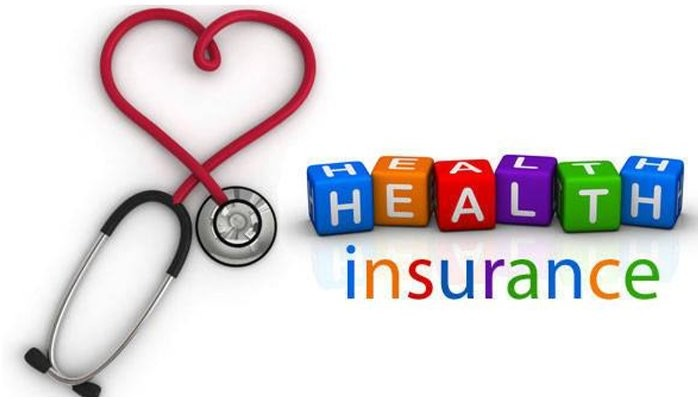

In [77]:
Image('img/imageInsurance.jpeg')

# **1. Overview**






### The medical insurance is one of the most important issues of any society. Therefore, the costs associated with this is very critical in any familiar budget. In this project, we´ll be dealing with two main questions:

### **--->** What are the primary factors influencing medical insurance expenses?

### **--->** How accurate is the Linear Regression machine learning technique in predicting medical expenses?

## *Core Question*

### **What is the estimated cost of a Medical Insurance?**


## *Arquitecture of the Project*

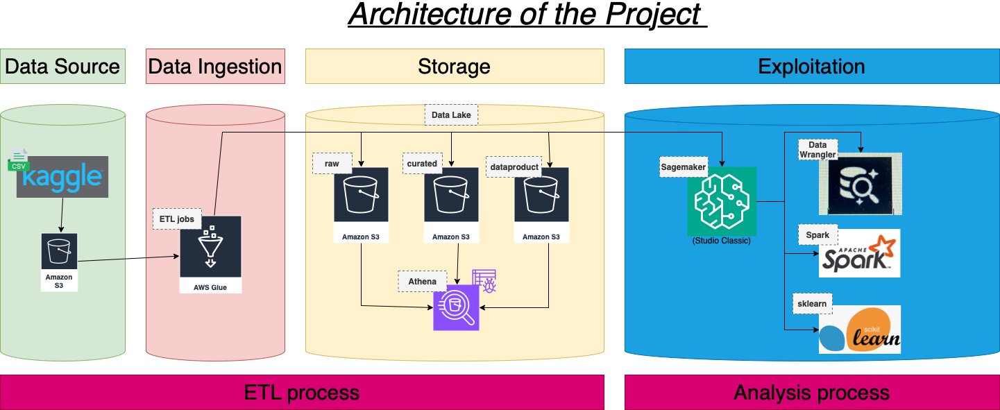

In [78]:
Image('img/ETL Project.drawio.png')

## *Preview of the data*

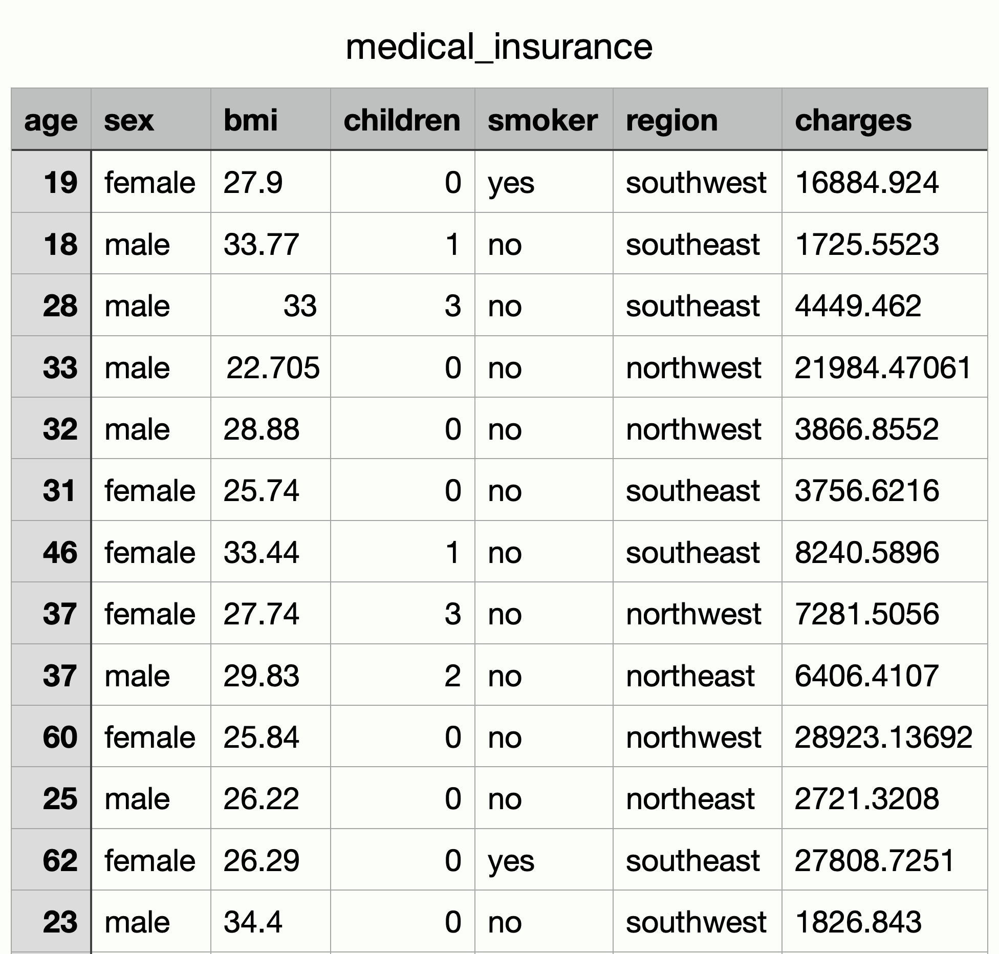

In [79]:
Image('img/Captura Tabla.png')

## *ETL of the Project*

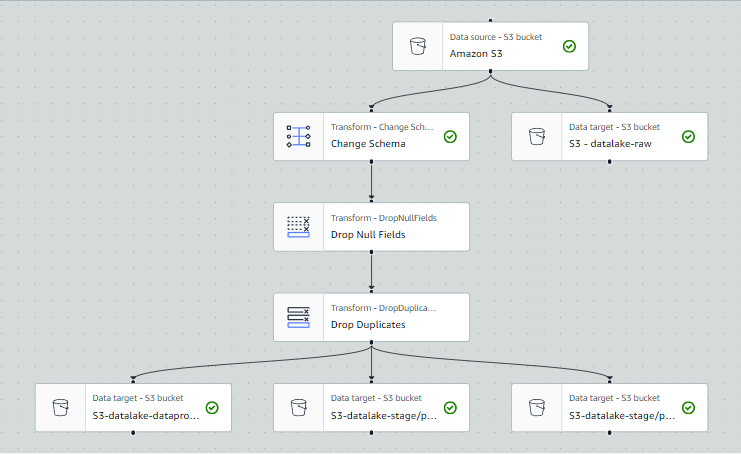

In [80]:
Image('img/ETL - drawing (projectETL).png')

## *How was the process of the ETL?....*

<h2 style="text-align: center;">Buckets</h2>

                                                                    

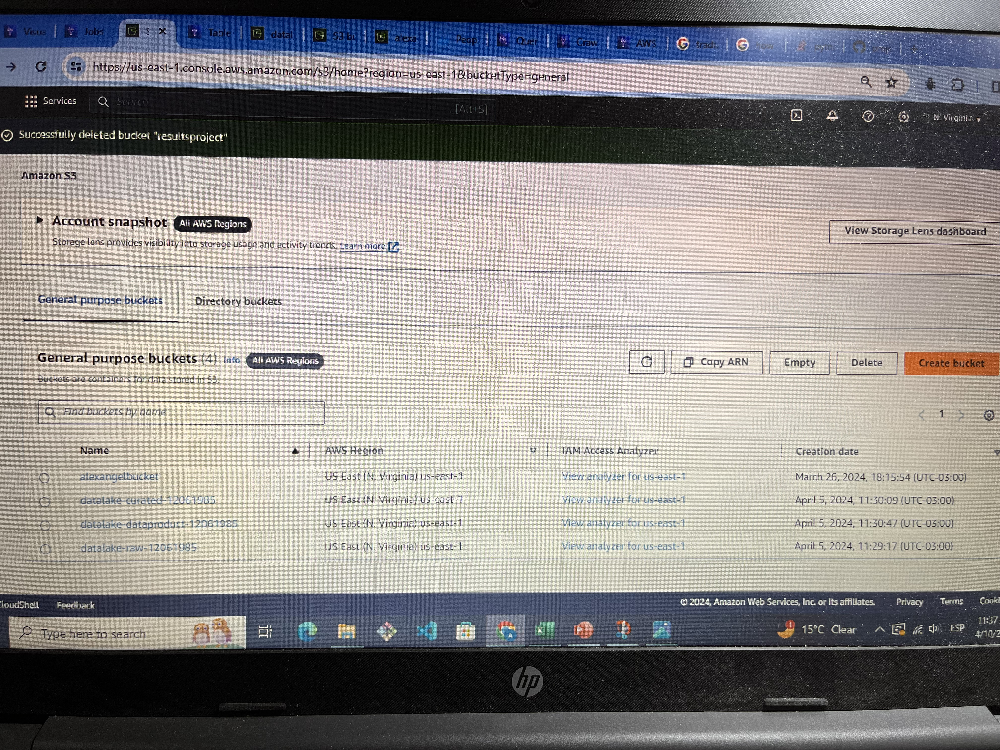

In [81]:
Image('img/buckets.jpg')

<h2 style="text-align: center;">Crawlers</h2>

In [ ]:
Image('img/crawlers.jpg')

<h2 style="text-align: center;">ETL job (data cleaning)</h2>


In [ ]:
Image('img/ETL job 1.jpg')

<h2 style="text-align: center;">ETL job (partitions)</h2>


In [ ]:
Image('img/ETL job 2.jpg')

In [ ]:
Image('img/partitionsSmoker.jpg')

In [ ]:
Image('img/ETL job 3.jpg')

In [ ]:
Image('img/partitionsChildren.jpg')

<h2 style="text-align: center;">Queries in Athena</h2>


In [ ]:
Image('img/query 1.jpg')

In [ ]:
Image('img/query 2.jpg')

In [ ]:
Image('img/query 3.jpg')

In [ ]:
Image('img/query 4.jpg')

In [ ]:
Image('img/query 5.jpg')

In [ ]:
Image('img/query 6.jpg')

In [ ]:
Image('img/query7.jpg')

In [ ]:
Image('img/query 8.jpg')

# **2. Libraries**

In [ ]:
# data and array managament
import pandas as pd
import numpy as np

# visualization libraries
import matplotlib.pyplot as plt
import seaborn as sb
%matplotlib inline

# sckikit-learn libraries
import sklearn
from sklearn import preprocessing
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score
import pickle

# spark libraries
from pyspark.sql import SparkSession
from pyspark.sql import functions as F
from pyspark.sql import SQLContext
from boto3.session import Session

# **3. Data Exploration with Spark**


### The data can be taken from two sources: S3 bucket in the the *raw stage* (you can create your own S3 bucket) or directly from the local environment.

In [ ]:
############################################### DATA FROM AWS S3 ################################################
################################################# (optional)  ###################################################

## 1. We must create a session to obtain the credentials from AWS using the library boto3

#session = Session(aws_access_key_id='<your_aws_access_key_id>',
#                  aws_secret_access_key='<your_aws_secret_access_key>')

## 2. We must create a resource from S3

#s3 = session.resource('s3')
#bucket = s3.Bucket("datalake-raw-12061985") # here, we spicify the name of the bucket
#bucket.download_file('dataCSV/medical_insurance.csv' , 'rawInsuranceCSV.csv' ) # first argument:the path of the file inside the bucket
#                                                                                                          # second argumnet:the path of the destination where the file is required

In [ ]:
################################################ DATA FROM LOCAL #################################################

# Create the Spark Session

spark = SparkSession.builder.appName('sparkInsurance').getOrCreate()

spark

In [ ]:
# Create the table 

insurance_df = spark.read.csv('medical_insurance.csv', sep=',', header=True)

insurance_df.show(5)

In [ ]:
insurance_df.count()

In [ ]:
## Drop Duplicates

insurance_df = insurance_df.dropDuplicates()

In [ ]:
insurance_df.count()

In [ ]:
## Drop Null values

insurance_df = insurance_df.na.drop(how='any')

In [ ]:
insurance_df.count()

### There were no null values in the dataset.

In [ ]:
# rename the column 'bmi' by 'body_mass_index'

insurance_df = insurance_df.withColumnsRenamed({'bmi':'body_mass_index'})

In [ ]:
insurance_df.show(3)

In [ ]:
# here, we have the charges in ascending order 
insurance_df.sort('charges')[['charges']].show()

In [ ]:
## 5. Apply filters :
## charges & smoker

insurance_df_filter = insurance_df.filter((insurance_df.charges > 35000) & (insurance_df.smoker == 'yes' ) )
insurance_df_filter.show()
print(f'The number of people who smoke and spend more than $35.000:',insurance_df_filter.count())

In [ ]:
insurance_df_filter = insurance_df.filter((insurance_df.charges > 35000) & (insurance_df.smoker == 'no' ) )
insurance_df_filter.show()
print(f'The number of people who don´t smoke and spend more than $35.000:',insurance_df_filter.count())

### From the previous data, we can see that there are 274 people who are smokers paying more than $35.000 in insurance versus 6 not being.

In [ ]:
## 6. Number of classes per feature
## smoker

insurance_df[['smoker']].distinct().show()
print('The number of classes here is:',insurance_df[['smoker']].distinct().count())

In [ ]:
## region

insurance_df[['region']].distinct().show()
print('The number of classes here is:',insurance_df[['region']].distinct().count())

In [ ]:
## age

insurance_df[['age']].distinct().show()
print('The number of classes here is:',insurance_df[['age']].distinct().count())

In [ ]:
## children

insurance_df[['children']].distinct().show()
print('The number of classes here is:',insurance_df[['children']].distinct().count())

In [ ]:
## sex

insurance_df[['sex']].distinct().show()
print('The number of classes here is:',insurance_df[['sex']].distinct().count())

In [ ]:
## smoker

insurance_df[['smoker']].distinct().show()
print('The number of classes here is:',insurance_df[['smoker']].distinct().count())

In [ ]:
## charges

insurance_df[['charges']].distinct().show()
print('The number of classes here is:',insurance_df[['charges']].distinct().count())

In [ ]:
## 7. Convert the file into a pandas dataframe

insurance_df_pd =  insurance_df.toPandas()
print(type(insurance_df_pd))
insurance_df_pd.head()

### We make this change because in the *Data Coding* there will be a usage of this dataframe.

# **4. Visualization ( Data Wrangler)**

### The data ingestion in this case was taken from the S3 bucket *"datalake-dataproduct-12061985"*, which is the dataproduct stage.

In [ ]:
Image('img/Data Wrangler Insights Report.png')

#### There are some **insights** we could extract from here:
* More than the half part of the dataset are charged between $0 and $15.000
* The number of smokers are more than five times the number of no smokers.
* The number of males and females are equal.
* The regions are distributed uniformly.
* The majority of the people do not have any children.
* The BMI (*Body Mass Index*) of the most of them are between 25 and 35.
* The range of ages are "balanced" because the disctribution is uniform between 20 and 60.


# **5. Data Coding**

#### In this part, we´ll perform some ***data coding*** from the resulting table in Spark.

In [ ]:
insurance_df_pd.head(10)

In [ ]:
insurance_df_pd.describe()

In [ ]:
insurance_df_pd.info()

### We can see there are three non-numerical variables: *sex,smoker and region*. We´ll "code" them. We´ll use the method of Scikit-learn named *LabelEncoder()*.

In [ ]:
# sex

encoder = preprocessing.LabelEncoder()

insurance_df_pd['sex']= encoder.fit_transform(insurance_df_pd['sex'])

insurance_df_pd['sex']

In [ ]:
# smoker

encoder = preprocessing.LabelEncoder()

insurance_df_pd['smoker']= encoder.fit_transform(insurance_df_pd['smoker'])

insurance_df_pd['smoker']

In [ ]:
# region

encoder = preprocessing.LabelEncoder()

insurance_df_pd['region']= encoder.fit_transform(insurance_df_pd['region'])

insurance_df_pd['region']

#### Now, we´ve done the *data coding* we can take a glance at how the dataset looks like right now.

In [ ]:
insurance_df_pd.head(5)

### We can see there are no categorical (non-numerical) values. Now, let´s take a look at the other library: Seaborn. We need to do further analysis with the heat map and the Pearson´s correlation matrix with all the variables to establish some relation between them (if there is some).

In [ ]:
# heatmap

sb.heatmap(insurance_df_pd[['age', 'sex', 'body_mass_index', 'children', 'smoker', 'region', 'charges']].corr(),annot = True)

#### From the Perason´s correlation we can see that the variables that are more related are "smoker" (feature) and "charges" (labels) with a number of 0,79 (the maximum possible value is 1). Moreover, we can see the correlation of all the variables with the target ('charges').

In [ ]:
corr_matrix = insurance_df_pd.corr()
corr_matrix

#### Moreover, we can see the correlation of all the variables with the label ('charges').

In [ ]:
corr_matrix['charges'].sort_values(ascending=False)

#### Once again, we see the closest relation is between smoker and charges. This will be useful for the selection of the attributes.

# **6. Selection of the attributes**

In [ ]:
X = insurance_df_pd['smoker']   ## X

Y = insurance_df_pd['charges']   ## Y

In [ ]:
X.shape

In [ ]:
Y.shape

In [ ]:
X_smoker = np.array(X).reshape(-1,1)
Y_charges = np.array(Y).reshape(-1,1)

print(X_smoker.shape)
print(Y_charges.shape)

##  **6.1 Train/Test/Val split**

In [ ]:
X_train,X_val, Y_train, Y_val = train_test_split(X_smoker,Y_charges, test_size=0.2)

In [ ]:
print(X_train.shape)
print(X_val.shape)
print(Y_train.shape)
print(Y_val.shape)

## **6.2 Scaler**

In [ ]:
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)

In [ ]:
X_train

In [ ]:
Y_train

In [ ]:
X_val = scaler.transform(X_val)

# **7. Training of the model (Linear Regression)**

## **7.1 Training the model**

In [ ]:
# here, we fix the model as Linear Regression

model = sklearn.linear_model.LinearRegression()
model.fit(X_train,Y_train)

## **7.2 Predictions of the model**

In [ ]:
print(X_val.shape)
Y_pred = model.predict(X_val)
print(Y_pred.shape)
print(Y_pred)

In [ ]:
list_of_predictions = pd.DataFrame(Y_pred)

In [ ]:
list_of_predictions.head(5)

## **7.3 Evaluation of the model**

### In the *Linear Regression* machine learning algorithm, we use *metrics* to calculate an error to summarize the predictive skill of a model. There are several sort of errors we could use, for instance,

**---->** *Mean Squared Error*

**---->** R^2 coefficient

**---->** *Root Mean Squared Error*

**---->** *Mean Absolute Error*

### Among them, we´ll use the *Mean Square Error* because of the fact that this one is less suitable to outliers. 

### **7.3.1** ***Mean Squared Error***

In [ ]:
# Mean Abosulte Error (MAE)
# here, we´ll use the library of SciKit-learn

errors = sklearn.metrics.mean_absolute_error(Y_val,Y_pred)

In [ ]:
print('The standard deviation is: $',errors)

#### It means that there might be an error or difference of $5537 when the prediction is done. 

### **7.3.2** ***R^2 coefficient***

In [ ]:
# R2 coefficient

r2_coefficient = r2_score(Y_val,Y_pred)
print('The R^2 coefficient is:',r2_coefficient)


#### It means that the models will predict correctly the cost of the medical insurance 65 times every 100 persons. 

# **8. Results**

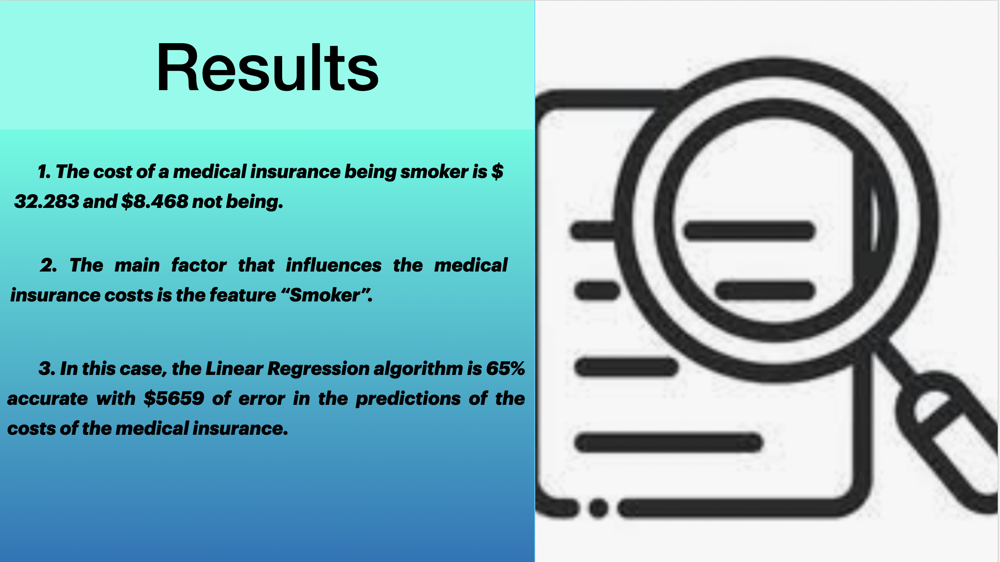

In [97]:
Image('img/Captura Results.png') 

# **9. Recommendations**

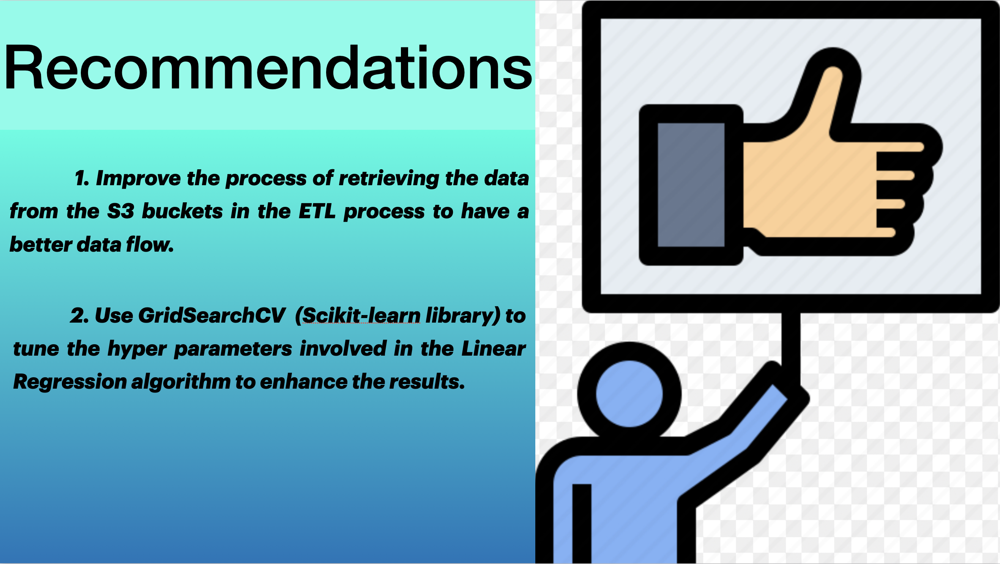

In [98]:
Image('img/Captura Recomendaciones.png') 